In [33]:
import os
gpu_num = 0 # Use "" to use the CPU
os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Colab does currently not support the latest version of ipython.
# Thus, the preview does not work in Colab. However, whenever possible we
# strongly recommend to use the scene preview mode.
try: # detect if the notebook runs in Colab
    import google.colab
    colab_compat = True # deactivate preview
except:
    colab_compat = False
resolution = [480,320] # increase for higher quality of renderings

# Allows to exit cell execution in Jupyter
class ExitCell(Exception):
    def _render_traceback_(self):
        pass

# Import Sionna
try:
    import sionna
except ImportError as e:
    # Install Sionna if package is not already installed
    import os
    os.system("pip install sionna")
    import sionna

# Configure the notebook to use only a single GPU and allocate only as much memory as needed
# For more details, see https://www.tensorflow.org/guide/gpu
import tensorflow as tf
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)
# Avoid warnings from TensorFlow
tf.get_logger().setLevel('ERROR')

tf.random.set_seed(1) # Set global random seed for reproducibility

In [34]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import math

# Import Sionna RT components
from sionna.channel import cir_to_ofdm_channel, subcarrier_frequencies, OFDMChannel, ApplyOFDMChannel
from sionna.nr import PUSCHConfig, PUSCHTransmitter, PUSCHReceiver
from sionna.utils import compute_ber, ebnodb2no, PlotBER
from sionna.ofdm import KBestDetector, LinearDetector
from sionna.mimo import StreamManagement

In [35]:
# Load blender scene
scene = load_scene("blender/test.xml")

In [36]:
# Configure antenna array for all transmitters
scene.tx_array = PlanarArray(num_rows=1,
                             num_cols=1,
                             vertical_spacing=0.5,
                             horizontal_spacing=0.5,
                             pattern="iso",
                             polarization="V")

# Configure antenna array for all receivers
scene.rx_array = PlanarArray(num_rows=1,
                             num_cols=1,
                             vertical_spacing=0.5,
                             horizontal_spacing=0.5,
                             pattern="iso",
                             polarization="V")

# Create transmitter
tx = Transmitter(name="tx",
                 position=[0.1,2.5,1])

# Add transmitter instance to scene
scene.add(tx)

# Create a receiver
rx = Receiver(name="rx",
              position=[5,2.5,1],
              orientation=[0.1,2.5,1])

# Add receiver instance to scene
scene.add(rx)

tx.look_at(rx) # Transmitter points towards receiver
rx.look_at(tx) # Receiver points towards transmitter

In [37]:
scene.frequency = 60e9 # in Hz; implicitly updates RadioMaterials

scene.synthetic_array = True # If set to False, ray tracing will be done per antenna element (slower for large arrays)

In [38]:
# Compute propagation paths
paths = scene.compute_paths(max_depth=4,
                            num_samples=1e6)  # Number of rays shot into directions defined
                                              # by a Fibonacci sphere , too few rays can
                                              # lead to missing paths

In [39]:
# Show the types of all paths:
# 0 - LoS, 1 - Reflected, 2 - Diffracted, 3 - Scattered
# Note that Diffraction and scattering are turned off by default.
print("Path types: ", paths.types.numpy())

Path types:  [[0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]]


In [70]:
#subcarrier_spacing = 15e3
#subcarrier_spacing = 30e3
#subcarrier_spacing = 60e3
subcarrier_spacing = 120e3
#subcarrier_spacing = 240e3
fft_size = 48

In [41]:
# Print shape of channel coefficients before the application of Doppler shifts
# The last dimension corresponds to the number of time steps which defaults to one
# as there is no mobility
print("Shape of `a` before applying Doppler shifts: ", paths.a.shape)

# Apply Doppler shifts
paths.apply_doppler(sampling_frequency=subcarrier_spacing, # Set to 15e3 Hz
                    num_time_steps=14, # Number of OFDM symbols
                    tx_velocities=[3.,0,0], # We can set additional tx speeds
                    rx_velocities=[0,7.,0]) # Or rx speeds

print("Shape of `a` after applying Doppler shifts: ", paths.a.shape)

paths.normalize_delays = False
a, tau = paths.cir()
print("Shape of tau: ", tau.shape)

Shape of `a` before applying Doppler shifts:  (1, 1, 1, 1, 1, 21, 1)
Shape of `a` after applying Doppler shifts:  (1, 1, 1, 1, 1, 21, 14)
Shape of tau:  (1, 1, 1, 21)


In [42]:
all_paths = tau.shape[3]
print(all_paths)

21


In [43]:
# Initialize the matrix with zeros
impulse_response = np.zeros((all_paths, 7))

unit = 0 # 0 = rad, 1 = degree 

for path_idx in range(all_paths):
    impulse_response[path_idx][0] = path_idx                                              # Path index
    impulse_response[path_idx][1] = np.abs(paths.a[0,0,0,0,0,path_idx, 0].numpy())        # Channel coefficient
    impulse_response[path_idx][2] = paths.tau[0,0,0,path_idx].numpy()                     # Propagation delay [s]

    if unit == 0:
        impulse_response[path_idx][3] = paths.theta_t[0,0,0,path_idx].numpy()             # Zenith angle of departure [rad]
        impulse_response[path_idx][4] = paths.phi_t[0,0,0,path_idx].numpy()               # Azimuth angle of departure [rad]
        impulse_response[path_idx][5] = paths.theta_r[0,0,0,path_idx].numpy()             # Zenith angle of arrival [rad]
        impulse_response[path_idx][6] = paths.phi_r[0,0,0,path_idx].numpy()               # Azimuth angle of arrival [rad]
        
    elif unit == 1:
        impulse_response[path_idx][3] = paths.theta_t[0,0,0,path_idx].numpy()*180/math.pi # Zenith angle of departure [°]
        impulse_response[path_idx][4] = paths.phi_t[0,0,0,path_idx].numpy()*180/math.pi   # Azimuth angle of departure [°]
        impulse_response[path_idx][5] = paths.theta_r[0,0,0,path_idx].numpy()*180/math.pi # Zenith angle of arrival [°]
        impulse_response[path_idx][6] = paths.phi_r[0,0,0,path_idx].numpy()*180/math.pi   # Azimuth angle of arrival [°]
  
print(impulse_response)
impulse_response.dump("impulse_response.dat")

[[ 0.00000000e+00  8.11453210e-05  1.63446412e-08  1.57079637e+00
   0.00000000e+00  1.57079637e+00 -3.14159274e+00]
 [ 1.00000000e+00  3.06164766e-05  1.70117698e-08  1.57079637e+00
   3.14159274e+00  1.57079637e+00 -3.14159274e+00]
 [ 2.00000000e+00  2.58463533e-05  2.50222900e-08  1.57079637e+00
   8.58989298e-01  1.57079637e+00  2.28260374e+00]
 [ 3.00000000e+00  2.27637838e-06  3.50837546e-08  1.46930671e+00
   3.14157367e+00  1.52680457e+00  3.14158487e+00]
 [ 4.00000000e+00  5.70714656e-06  4.00547542e-08  1.57079649e+00
  -1.23946822e+00  1.57079637e+00  1.99613631e+00]
 [ 5.00000000e+00  4.04910816e-06  3.94163493e-08  1.52222013e+00
   5.02061844e-01  1.49183178e+00  2.63843870e+00]
 [ 6.00000000e+00  3.47309856e-06  4.22533546e-08  1.57079637e+00
   6.85858250e-01  1.57079637e+00  3.01729631e+00]
 [ 7.00000000e+00  3.97591566e-06  4.02807707e-08  1.57079637e+00
   4.89687651e-01  1.57079637e+00  2.65187788e+00]
 [ 8.00000000e+00  8.76866397e-06  3.65659396e-08  1.58904183e+0

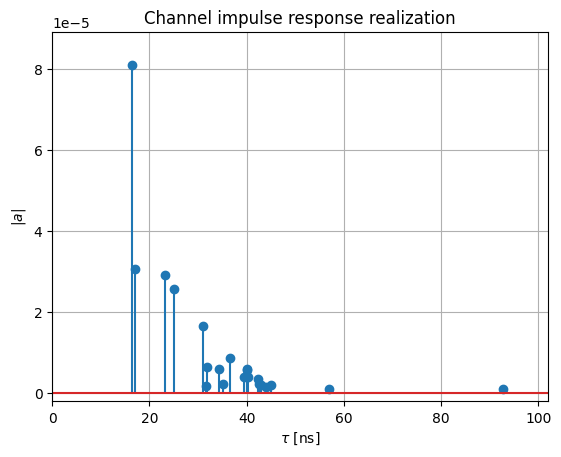

In [44]:
t = tau[0,0,0,:]/1e-9 # Scale to ns
a_abs = np.abs(a)[0,0,0,0,0,:,0]
a_max = np.max(a_abs)
# Add dummy entry at start/end for nicer figure
t = np.concatenate([(0.,), t, (np.max(t)*1.1,)])
a_abs = np.concatenate([(np.nan,), a_abs, (np.nan,)])

# And plot the CIR
plt.figure()
plt.title("Channel impulse response realization")

plt.stem(t, a_abs)
plt.xlim([0, np.max(t)])
plt.ylim([-2e-6, a_max*1.1])
plt.xlabel(r"$\tau$ [ns]")
plt.ylabel(r"$|a|$");
plt.grid()

In [45]:
#cm = scene.coverage_map(max_depth=5,
#                        diffraction=True, # Disable to see the effects of diffraction
#                        cm_cell_size=(0.05, 0.05), # Grid size of coverage map cells in m
#                        combining_vec=None,
#                        precoding_vec=None,
#                        num_samples=int(20e6)) # Reduce if your hardware does not have enough memory

In [46]:
def switch(show):
    if show == "scene":
        return scene.preview()
    elif show == "paths":
        return scene.preview(paths, show_devices=True, show_paths=True, fov=90, clip_at=2.99)
    elif show == "cm":
        return scene.preview(coverage_map=cm)

switch("paths")

Renderer(camera=PerspectiveCamera(aspect=1.31, children=(DirectionalLight(intensity=0.25, position=(0.0, 0.0, …

In [120]:
# Compute frequencies of subcarriers and center around carrier frequency
frequencies = subcarrier_frequencies(fft_size, subcarrier_spacing)

# Compute the frequency response of the channel at frequencies.
h_freq = cir_to_ofdm_channel(frequencies,
                             a,
                             tau,
                             normalize=True) # Non-normalized includes path-loss

# Verify that the channel power is normalized
h_avg_power = tf.reduce_mean(tf.abs(h_freq)**2).numpy()

print("Average power h_freq: ", h_avg_power) # Channel is normalized

Average power h_freq:  1.0


In [121]:
# Placeholder for tx signal of shape
# [batch size, num_tx, num_tx_ant, num_ofdm_symbols, fft_size]
x = tf.zeros([h_freq.shape.as_list()[i] for i in [0,3,4,5,6]], tf.complex64)

no = 0.1 # noise variance

# Init channel layer
channel = ApplyOFDMChannel(add_awgn=True)

# Apply channel
y = channel([x, h_freq, no])

# [batch size, num_rx, num_rx_ant, num_ofdm_symbols, fft_size]
print(y.shape)

(1, 1, 1, 14, 48)


In [122]:
# Init pusch_transmitter
pusch_config = PUSCHConfig()

# Instantiate a PUSCHTransmitter from the PUSCHConfig
pusch_transmitter = PUSCHTransmitter(pusch_config)

# Create a PUSCHReceiver using the PUSCHTransmitter
pusch_receiver = PUSCHReceiver(pusch_transmitter)

In [123]:
# Simulate transmissions over the
batch_size = 100 # h_freq is broadcast, i.e., same CIR for all samples but different AWGN realizations
ebno_db = 2. # SNR in dB

no = ebnodb2no(ebno_db,
               pusch_transmitter._num_bits_per_symbol,
               pusch_transmitter._target_coderate,
               pusch_transmitter.resource_grid)

x, b = pusch_transmitter(batch_size) # Generate transmit signal and info bits

y = channel([x, h_freq, no]) # Simulate channel output

b_hat = pusch_receiver([y, no]) # Recover the info bits

# Compute BER
print(f"BER: {compute_ber(b, b_hat).numpy():.5f}")

BER: 0.21962


In [124]:
# Simulate transmissions over the
batch_size = 1000 # h_freq is broadcast, i.e., same CIR for all samples but different AWGN realizations
ebno_db = np.linspace(0, 13, num=14)
#BER = []
BER = np.zeros(shape=(len(ebno_db),2))
i = 0

for ebno in ebno_db:
    no = ebnodb2no(ebno,
               pusch_transmitter._num_bits_per_symbol,
               pusch_transmitter._target_coderate,
               pusch_transmitter.resource_grid)
    
    x, b = pusch_transmitter(batch_size) # Generate transmit signal and info bits

    y = channel([x, h_freq, no]) # Simulate channel output

    b_hat = pusch_receiver([y, no]) # Recover the info bits

    #ber_value = compute_ber(b, b_hat).numpy()
    #BER.append([i, ber_value])  # Append the Eb/No and BER pair to the list
    BER[i,0] = compute_ber(b, b_hat).numpy()
    BER[i,1] = 0
    i = i + 1

print(BER)

[[2.57574704e-01 0.00000000e+00]
 [2.37584320e-01 0.00000000e+00]
 [2.19416420e-01 0.00000000e+00]
 [1.99592456e-01 0.00000000e+00]
 [1.80139053e-01 0.00000000e+00]
 [1.59143491e-01 0.00000000e+00]
 [1.32581361e-01 0.00000000e+00]
 [1.01398669e-01 0.00000000e+00]
 [6.66819527e-02 0.00000000e+00]
 [3.46420118e-02 0.00000000e+00]
 [1.09341716e-02 0.00000000e+00]
 [2.47781065e-03 0.00000000e+00]
 [7.21153846e-04 0.00000000e+00]
 [1.47928994e-06 0.00000000e+00]]


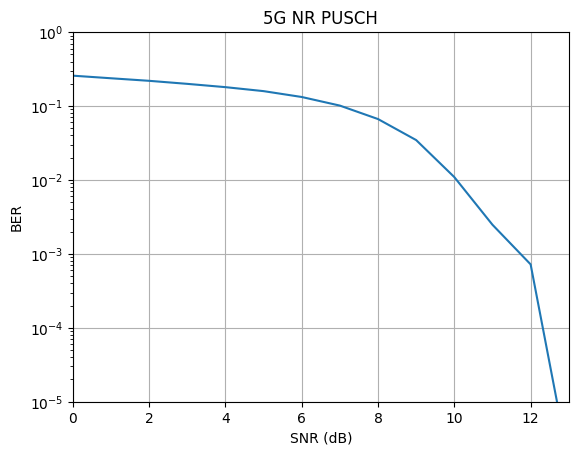

In [125]:
plt.figure()
plt.title("5G NR PUSCH")
plt.xlabel("SNR (dB)")
plt.ylabel("BER")
plt.grid(True)
plt.xlim([ebno_db.min(), ebno_db.max()])
plt.ylim([1e-5, 1.0])
plt.semilogy(ebno_db, BER[:,0])